In [68]:
%load_ext autoreload
%autoreload 2

import time
import math
import copy
import torch
from torch import nn, optim
import numpy as np
import awkward as ak
import uproot
import pandas as pd
import dask
import vector
import particle
import hepunits

import zuko
import torch
from torch import nn, optim
import lightning as L
from lightning.pytorch import loggers as pl_loggers

from torch.utils.data import DataLoader

from memflow.dataset.data import RootData,ParquetData
from memflow.dataset.dataset import CombinedDataset
from memflow.HH.HH import HHbbWWDoubleLeptonGenDataset,HHbbWWDoubleLeptonRecoDataset
from memflow.read_data import utils
from memflow.callbacks.transfer_flow_callbacks import *

from matplotlib import pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 100})

vector.register_awkward()

print (f"Running on GPU : {torch.cuda.is_available()}")
accelerator = 'gpu' if torch.cuda.is_available() else 'cpu'
print (f"Accelerator : {accelerator}")
torch.set_float32_matmul_precision('medium')  
if accelerator =='gpu':
    torch.cuda.empty_cache()
    print (torch.cuda.memory_summary(device=None, abbreviated=True))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Running on GPU : True
Accelerator : gpu
|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |  34200 KiB | 170860 KiB |  16092 MiB |  16059 MiB |
|---------------------------------------------------------------------------|
| Active memory         |  34200 KiB | 170860 KiB |  16092 MiB |  16059 MiB |
|---------------------------------------------------------------------------|
| Requested me

In [69]:
gen_data = RootData(
    files = [
        '/home/ucl/cp3/fbury/scratch/MEM_data/Transfermer_v3/results/GluGluToHHTo2B2VTo2L2Nu_node_cHHH1.root',
    ],
    treenames = [
        'gen_HH;1',
    ],
    lazy = True,
    N = 1000,
)

print (gen_data)

Data object
Loaded branches:
   ... file: 1000
   ... sample: 1000
   ... tree: 1000
Branch in files not loaded:
   ... H1_E
   ... H1_Px
   ... H1_Py
   ... H1_Pz
   ... H1_eta
   ... H1_idx
   ... H1_mass
   ... H1_pdgId
   ... H1_phi
   ... H1_pt
   ... H1_sum_E
   ... H2_E
   ... H2_Px
   ... H2_Py
   ... H2_Pz
   ... H2_eta
   ... H2_idx
   ... H2_mass
   ... H2_pdgId
   ... H2_phi
   ... H2_pt
   ... H2_sum_E
   ... ISR_10_E
   ... ISR_10_Px
   ... ISR_10_Py
   ... ISR_10_Pz
   ... ISR_10_eta
   ... ISR_10_idx
   ... ISR_10_mass
   ... ISR_10_parent
   ... ISR_10_pdgId
   ... ISR_10_phi
   ... ISR_10_pt
   ... ISR_11_E
   ... ISR_11_Px
   ... ISR_11_Py
   ... ISR_11_Pz
   ... ISR_11_eta
   ... ISR_11_idx
   ... ISR_11_mass
   ... ISR_11_parent
   ... ISR_11_pdgId
   ... ISR_11_phi
   ... ISR_11_pt
   ... ISR_12_E
   ... ISR_12_Px
   ... ISR_12_Py
   ... ISR_12_Pz
   ... ISR_12_eta
   ... ISR_12_idx
   ... ISR_12_mass
   ... ISR_12_parent
   ... ISR_12_pdgId
   ... ISR_12_phi
   .

In [70]:
gen_dataset = HHbbWWDoubleLeptonGenDataset(
    data = gen_data,
    selection = [
        'leptons',
        'bquarks',
    ],
    coordinates = 'cylindrical',
    apply_boost = False,
    apply_preprocessing = True,
    build = True,
    dtype = torch.float32,
)
print (gen_dataset)

Selecting 965 events out of 1000
Saving objects to /auto/home/users/f/b/fbury/HHMEM/MEMFlow/memflow/HH/hh_gen
No final state recorded with `final_states_object_name` property, will not compute PS points
Parton dataset with 965 events
 Initial states pdgids : [21, 21]
 Final states pdgids   : [6, -6, 11, -12, -11, 12]
 Final states masses   : [172.5, 172.5, 0.0005109989499999999, 0.0, 0.0005109989499999999, 0.0]
Containing the following tensors
leptons  : data ([965, 4, 5]), mask ([965, 4])
           Mask exist    : [100.00%, 100.00%, 100.00%, 100.00%]
           Mask corr     : [True, True, True, True]
           Weights       : 965.000000, 965.000000, 965.000000, 965.000000
           Features      : ['pt', 'eta', 'phi', 'mass', 'pdgId']
           Selected for batches : True
higgs    : data ([965, 2, 5]), mask ([965, 2])
           Mask exist    : [100.00%, 100.00%]
           Mask corr     : [True, True]
           Weights       : 965.000000, 965.000000
           Features      : [

In [71]:
reco_data = RootData(
    files = gen_data.files,
    treenames = [
        'reco_DL;1',
    ],
    lazy = True,
    N = gen_data.N,
)
print ('Initial :',reco_data.events)

mask_resolved = np.logical_and.reduce(
    (
        reco_data['flag_SR']==1, 
        reco_data['flag_resolved']==1,
        reco_data['n_AK4']<= 8,
    )
)
reco_data.cut(mask_resolved)
print ('Resolved SR :',reco_data.events)
print (reco_data)


Initial : 1000
Resolved SR : 146
Data object
Loaded branches:
   ... file: 146
   ... flag_SR: 146
   ... flag_resolved: 146
   ... n_AK4: 146
   ... sample: 146
   ... tree: 146
Branch in files not loaded:
   ... VBF1_E
   ... VBF1_Px
   ... VBF1_Py
   ... VBF1_Pz
   ... VBF1_eta
   ... VBF1_idx
   ... VBF1_mass
   ... VBF1_phi
   ... VBF1_pt
   ... VBF1_sel
   ... VBF2_E
   ... VBF2_Px
   ... VBF2_Py
   ... VBF2_Pz
   ... VBF2_eta
   ... VBF2_idx
   ... VBF2_mass
   ... VBF2_phi
   ... VBF2_pt
   ... VBF2_sel
   ... VBF3_E
   ... VBF3_Px
   ... VBF3_Py
   ... VBF3_Pz
   ... VBF3_eta
   ... VBF3_idx
   ... VBF3_mass
   ... VBF3_phi
   ... VBF3_pt
   ... VBF3_sel
   ... VBF4_E
   ... VBF4_Px
   ... VBF4_Py
   ... VBF4_Pz
   ... VBF4_eta
   ... VBF4_idx
   ... VBF4_mass
   ... VBF4_phi
   ... VBF4_pt
   ... VBF4_sel
   ... VBF5_E
   ... VBF5_Px
   ... VBF5_Py
   ... VBF5_Pz
   ... VBF5_eta
   ... VBF5_idx
   ... VBF5_mass
   ... VBF5_phi
   ... VBF5_pt
   ... VBF5_sel
   ... VBF6_E
   .

In [72]:
reco_dataset = HHbbWWDoubleLeptonRecoDataset(
    data = reco_data,
    selection = [
        'muons',
        'electrons',
        'met',
        'jets',
    ],
    coordinates = 'cylindrical',
    apply_boost = False,
    apply_preprocessing = True,
    default_features = {
        'pt': 0.,
        'eta': 0.,
        'phi': 0.,
        'btag' : -1.,
        'btagged': None,
        'pdgId' : 0.,
        'charge' : 0.
    },
    build = True,
    dtype = torch.float32,
)
print (reco_dataset)

Saving objects to /auto/home/users/f/b/fbury/HHMEM/MEMFlow/memflow/HH/hh_reco
Reco dataset with 146 events
Containing the following tensors
boost      : data ([146, 1, 7]), mask ([146, 1])
             Mask exist    : [100.00%]
             Mask corr     : [True]
             Weights       : 146.000000
             Features      : ['pt', 'eta', 'phi', 'btag', 'pdgId', 'charge', 'mass']
             Selected for batches : False
jets       : data ([146, 5, 7]), mask ([146, 5])
             Mask exist    : [100.00%, 100.00%, 48.63%, 17.81%, 4.11%]
             Mask corr     : [True, True, False, False, False]
             Weights       : 146.000000, 146.000000, 146.000000, 146.000000, 146.000000
             Features      : ['pt', 'eta', 'phi', 'btag', 'pdgId', 'charge', 'mass']
             Selected for batches : True
electrons  : data ([146, 2, 7]), mask ([146, 2])
             Mask exist    : [65.07%, 27.40%]
             Mask corr     : [True, True]
             Weights       : 146.00

In [73]:
comb_dataset = CombinedDataset(
    gen_dataset = gen_dataset,
    reco_dataset = reco_dataset,
    intersection_branch = 'event',
)
print (comb_dataset)

Looking into file metadata
	entry 0 : ['/home/ucl/cp3/fbury/scratch/MEM_data/Transfermer_v3/results/GluGluToHHTo2B2VTo2L2Nu_node_cHHH1.root']
	entry 1 : ['/home/ucl/cp3/fbury/scratch/MEM_data/Transfermer_v3/results/GluGluToHHTo2B2VTo2L2Nu_node_cHHH1.root']
Will only consider common files : ['/home/ucl/cp3/fbury/scratch/MEM_data/Transfermer_v3/results/GluGluToHHTo2B2VTo2L2Nu_node_cHHH1.root']
(Note : this assumes the files have the same order between the different data objects
For entry 0 : from 965 events, 141 selected
For entry 1 : from 146 events, 141 selected
Combined dataset (extracting 141 events of the following) :
Parton dataset with 965 events
 Initial states pdgids : [21, 21]
 Final states pdgids   : [6, -6, 11, -12, -11, 12]
 Final states masses   : [172.5, 172.5, 0.0005109989499999999, 0.0, 0.0005109989499999999, 0.0]
Containing the following tensors
leptons  : data ([965, 4, 5]), mask ([965, 4])
           Mask exist    : [100.00%, 100.00%, 100.00%, 100.00%]
           Mask

In [74]:
# Split dataset into training and validation
# Not randomly for reproducilibility, but just based on number

train_frac = 0.8
indices = torch.arange(len(comb_dataset))
sep = int(train_frac*len(comb_dataset))
train_indices = indices[:sep]
valid_indices = indices[sep:]

comb_dataset_train = torch.utils.data.Subset(comb_dataset,train_indices)
comb_dataset_valid = torch.utils.data.Subset(comb_dataset,valid_indices)
print (len(comb_dataset_train),len(comb_dataset_valid))

batch_size = 1024

loader_comb_train = DataLoader(
    comb_dataset_train,
    batch_size = batch_size,
    shuffle = True,
)
loader_comb_valid = DataLoader(
    comb_dataset_valid,
    batch_size = 10000,
    shuffle = False,
)

112 29


In [87]:
from memflow.transfer_flow.transfer_flow_model import TransferFlow

model = TransferFlow(
    embed_dim = 64,
    embed_act = nn.GELU,
    n_gen_particles_per_type = gen_dataset.number_particles_per_type,
    gen_particle_type_names = gen_dataset.selection,
    gen_input_features_per_type = gen_dataset.input_features,
    n_reco_particles_per_type = reco_dataset.number_particles_per_type,
    reco_particle_type_names = reco_dataset.selection,
    reco_input_features_per_type = reco_dataset.input_features,
    flow_input_features = [
        ['pt','eta','phi'], # electrons
        ['pt','eta','phi'], # muons
        ['pt','phi'],       # met
        ['pt','eta','phi'], # jets
    ],
    autoregressive_mode = 'global', # 'type' or 'particle'
    reco_mask_corr = reco_dataset.correlation_mask,
    gen_mask_corr = gen_dataset.correlation_mask,
    transformer_args = {
        'nhead' : 8,
        'num_encoder_layers' : 8, 
        'num_decoder_layers' : 8, 
        'dim_feedforward' : 128, 
        'dropout' : 0., 
        'activation' : 'gelu', 
    },
    flow_args = {
        'bins' : 32,
        'transforms' : 5,
        'randperm' : False,
        'passes' : 2,
        'hidden_features' : [128] * 3,   
    },
    onehot_encoding = True,
)
model = model.cpu()

batch = next(iter(loader_comb_train))
log_probs, mask, weights = model(batch)
print ('log_probs',log_probs,log_probs.shape)
print ('mask',mask,mask.shape)
print ('weights',weights,weights.shape)

log_probs_tot = model.shared_eval(batch,0,'test')
print ('tot log probs',log_probs_tot)

samples = model.sample(batch['gen']['data'],batch['gen']['mask'],batch['reco']['data'],batch['reco']['mask'],N=100)
print ('samples')
for sample in samples:
    print ('\t',sample.shape)

print (model)


log_probs tensor([[4.3566, 4.0989, 4.9934,  ..., 4.9019, 4.0277, 4.0499],
        [3.6742, 4.1378, 4.6222,  ..., 4.1242, 4.1300, 4.1365],
        [4.9680, 4.1284, 4.9801,  ..., 3.7860, 4.6572, 4.0327],
        ...,
        [4.7581, 4.8302, 3.9526,  ..., 3.9768, 3.9837, 3.9940],
        [4.8994, 4.9915, 4.0365,  ..., 4.0587, 4.0411, 4.0398],
        [4.1931, 4.0173, 4.6559,  ..., 5.7633, 3.9384, 3.9668]],
       grad_fn=<NegBackward0>) torch.Size([112, 10])
mask tensor([[1., 0., 1.,  ..., 1., 0., 0.],
        [1., 0., 1.,  ..., 0., 0., 0.],
        [1., 0., 1.,  ..., 1., 1., 0.],
        ...,
        [1., 1., 0.,  ..., 0., 0., 0.],
        [1., 1., 0.,  ..., 0., 0., 0.],
        [1., 0., 1.,  ..., 1., 0., 0.]]) torch.Size([112, 10])
weights tensor([[1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        ...,
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.

In [63]:
##### Parameters #####
epochs = 1000
steps_per_epoch_train = math.ceil(len(comb_dataset_train)/loader_comb_train.batch_size)
# steps_per_epoch_valid = math.ceil(len(dataset_valid)/loader_valid.batch_size)

print (f'Training   : Batch size = {loader_comb_train.batch_size} => {steps_per_epoch_train} steps per epoch')
# print (f'Validation : Batch size = {loader_valid.batch_size} => {steps_per_epoch_valid} steps per epoch')
##### Optimizer #####
optimizer = optim.RAdam(model.parameters(), lr=1e-3)
model.set_optimizer(optimizer)

##### Scheduler #####
# scheduler = torch.optim.lr_scheduler.OneCycleLR(
#     optimizer = optimizer, 
#     max_lr = 1e-3, 
#     epochs = epochs, 
#     steps_per_epoch = steps_per_epoch_train, 
#     pct_start = 0.20, 
#     anneal_strategy='cos', 
#     cycle_momentum=True, 
#     base_momentum=0.85, 
#     max_momentum=0.95, 
#     div_factor=1e3, 
#     final_div_factor=1e5,
# )
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer = optimizer,
    mode='min', 
    factor=0.1, 
    patience=10, 
    threshold=0.001, 
    threshold_mode='rel', 
    cooldown=5, 
    min_lr=1e-7
)
model.set_scheduler_config(
    {
        'scheduler' : scheduler,
        'interval' : 'step' if isinstance(scheduler,optim.lr_scheduler.OneCycleLR) else 'epoch',
        'frequency' : 1,
        'monitor' : 'val/loss',
        'strict' : True,
        'name' : 'scheduler',
    }
)

##### Callbacks #####
callbacks = [
    L.pytorch.callbacks.LearningRateMonitor(logging_interval = 'epoch'),
    L.pytorch.callbacks.ModelSummary(max_depth=2),
    #sampling,
    #bias,
] 

##### Logger #####
logger = pl_loggers.CometLogger(
    save_dir = '../comet_logs',
    project_name = 'mem-flow-HH',
    experiment_name = 'HH',
    offline = False,
) 
#logger.log_graph(model)
# logger.log_hyperparams()
# logger.experiment.log_code(folder='../src/')
#logger.experiment.log_notebook(filename=globals()['__session__'],overwrite=True)

##### Trainer #####
trainer = L.Trainer(    
    min_epochs = 5,
    max_epochs = epochs,
    callbacks = callbacks,
    devices = 'auto',
    accelerator = accelerator,
    logger = logger,
    log_every_n_steps = steps_per_epoch_train,
)
##### Fit #####
trainer.fit(
    model = model, 
    train_dataloaders = loader_comb_train,
    val_dataloaders = loader_comb_valid,
)

CometLogger will be initialized in online mode
/home/ucl/cp3/fbury/scratch/anaconda3/envs/mem-flow/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/ucl/cp3/fbury/scratch/anaconda3/envs/mem-flow/ ...
Trainer already configured with model summary callbacks: [<class 'lightning.pytorch.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: torch, sklearn.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.


Training   : Batch size = 1024 => 1 steps per epoch


COMET INFO: Experiment is live on comet.com https://www.comet.com/florianbury/mem-flow-hh/847d9af4ba064d828452ccf5259bcf5a

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type               | Params | Mode 
-------------------------------------------------------------------
0 | gen_embeddings      | ModuleList         | 384    | train
1 | gen_embeddings.0    | Sequential         | 384    | train
2 | reco_embeddings     | ModuleList         | 1.2 K  | train
3 | reco_embeddings.0   | Sequential         | 1.2 K  | train
4 | transformer         | Transformer        | 669 K  | train
5 | transformer.encoder | TransformerEncoder | 267 K  | train
6 | transformer.decoder | TransformerDecoder | 402 K  | train
7 | flows               | ModuleList         | 807 K  | train
8 | flows.0             | ModuleDict         | 807 K  | train
-------------------------------------------------------------------
1.5 M     Trainable params
0         Non-trainable params
1.5 M     Total par

Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

/home/ucl/cp3/fbury/scratch/anaconda3/envs/mem-flow/lib/python3.10/site-packages/zuko/transforms.py:493: UserWarning: torch.searchsorted(): input value tensor is non-contiguous, this will lower the performance due to extra data copy when converting non-contiguous tensor to contiguous, please use contiguous input value tensor if possible. This message will only appear once per program. (Triggered internally at /opt/conda/conda-bld/pytorch_1699449181202/work/aten/src/ATen/native/BucketizationUtils.h:32.)
  return torch.searchsorted(seq, value).squeeze(dim=-1)


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

/home/ucl/cp3/fbury/scratch/anaconda3/envs/mem-flow/lib/python3.10/site-packages/lightning/pytorch/trainer/call.py:54: Detected KeyboardInterrupt, attempting graceful shutdown...
COMET INFO: The process of logging environment details (conda environment, git patch) is underway. Please be patient as this may take some time.
COMET WARNING: Experiment was interrupted by user while waiting for the initial data logger to be flushed.
COMET WARNING: Failed to complete logging of all environment details (conda environment, git patch)
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : HH
COMET INFO:     url                   : https://www.comet.com/florianbury/mem-flow-hh/847d9af4ba064d828452ccf5259bcf5a
COMET

KeyboardInterrupt: 

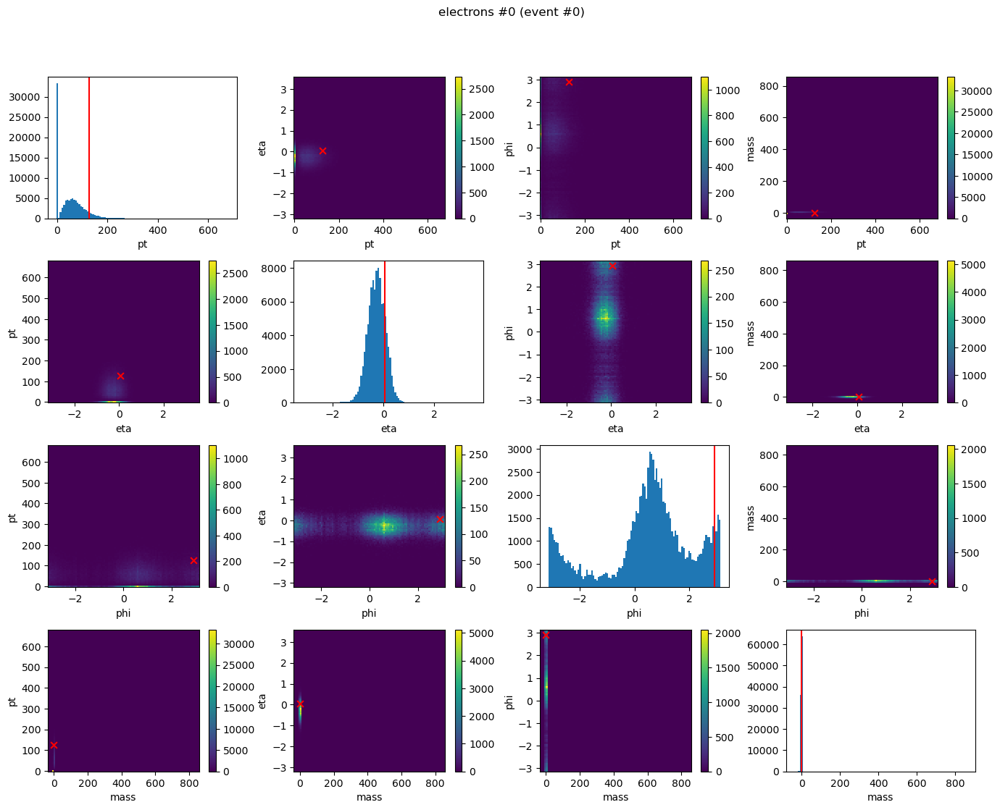

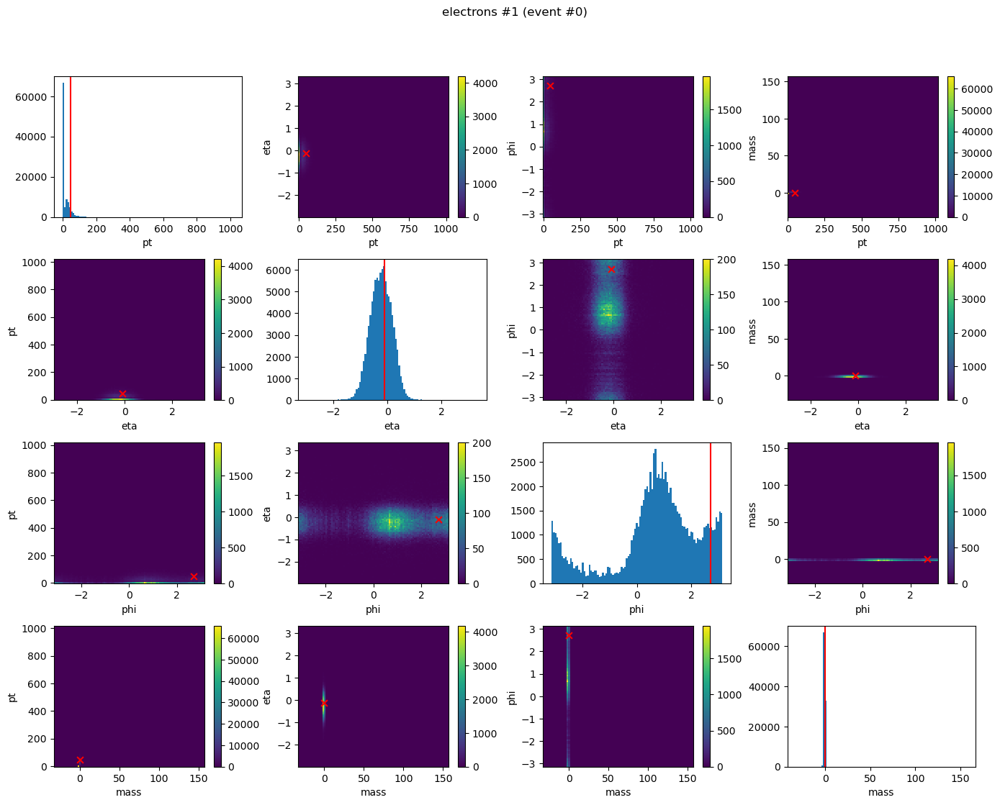

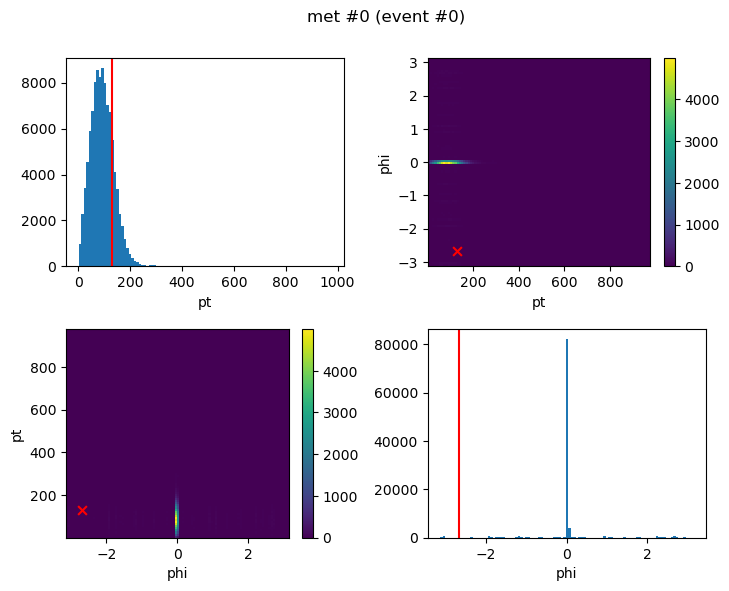

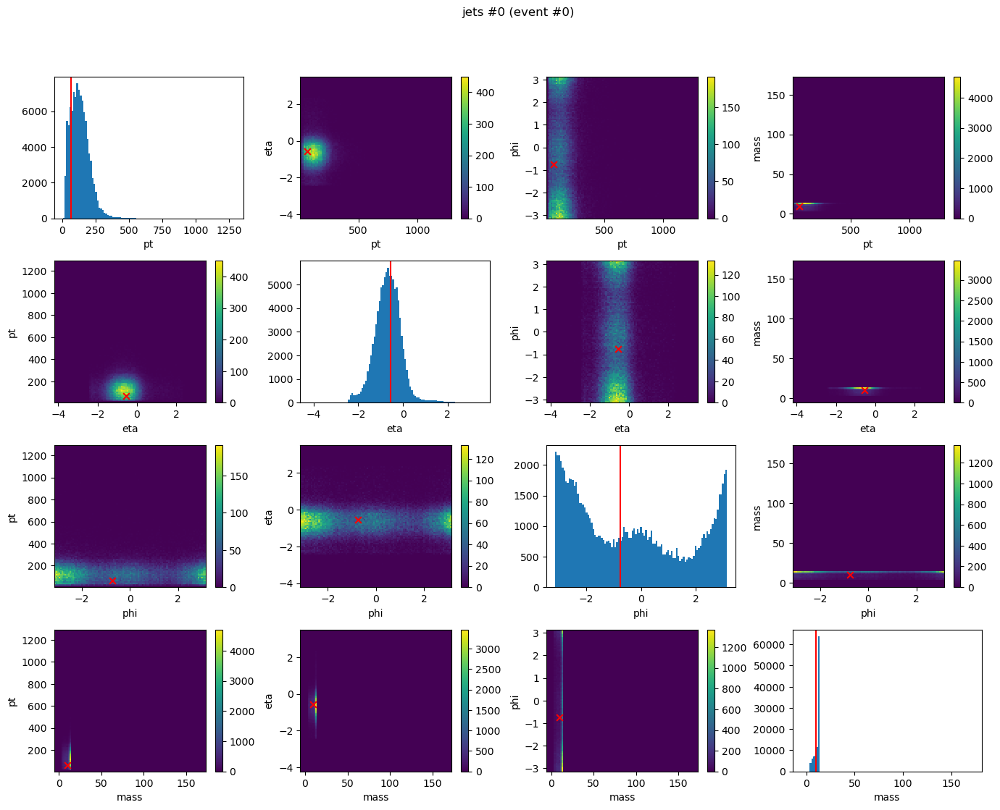

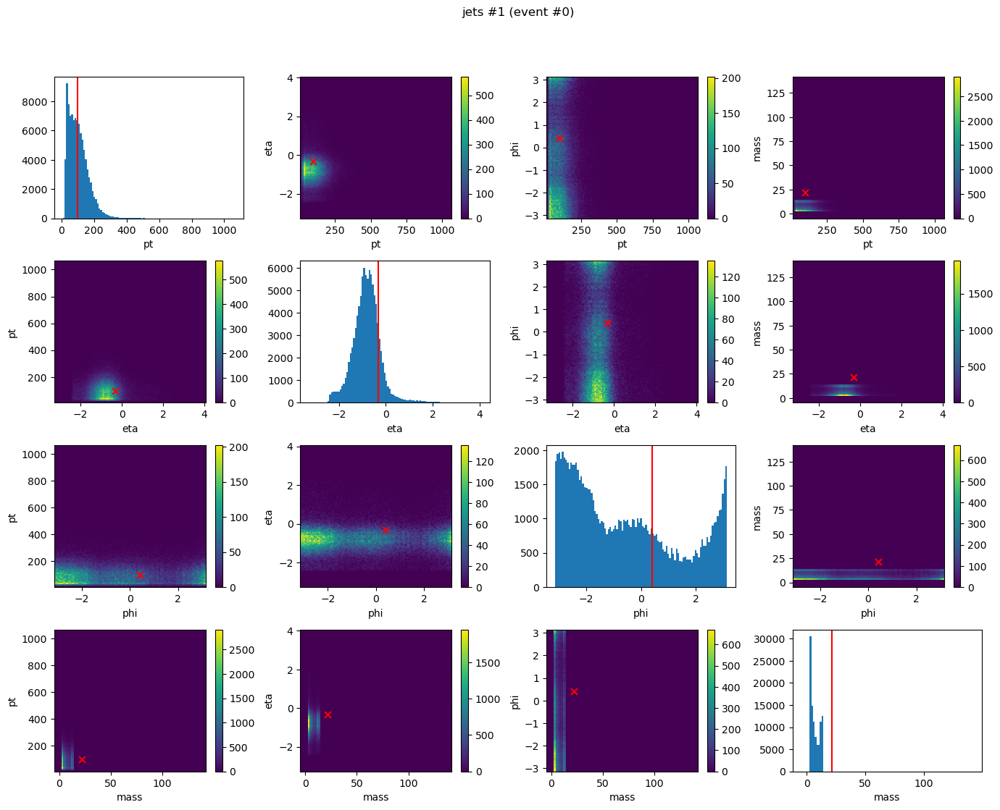

...

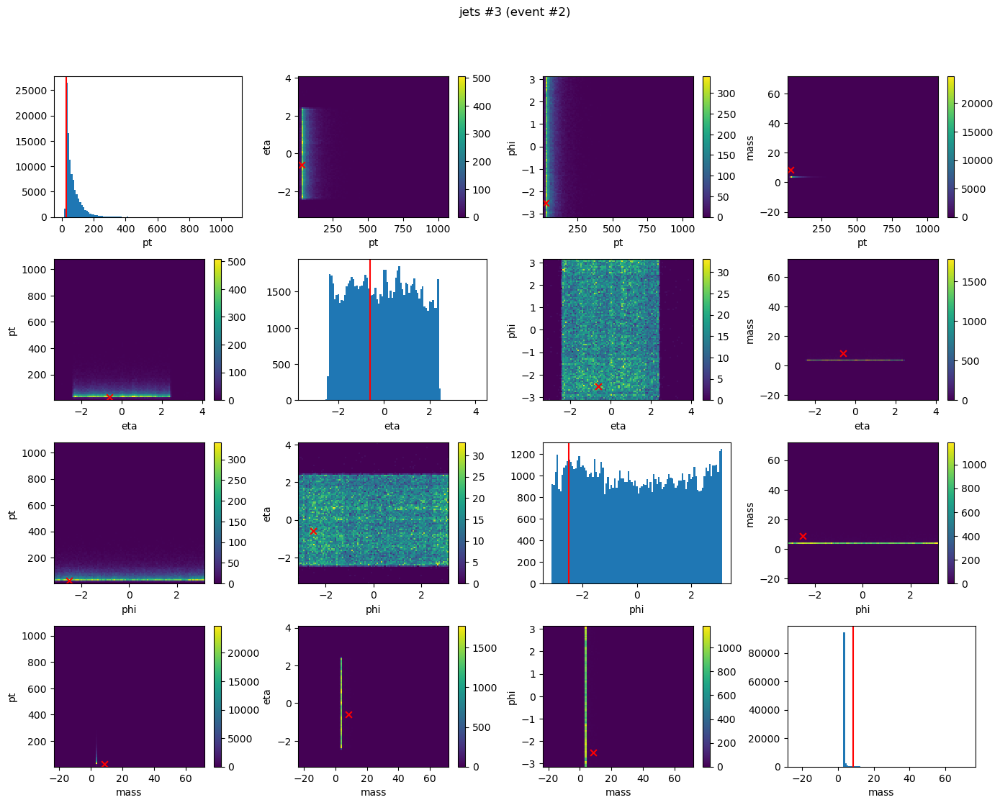

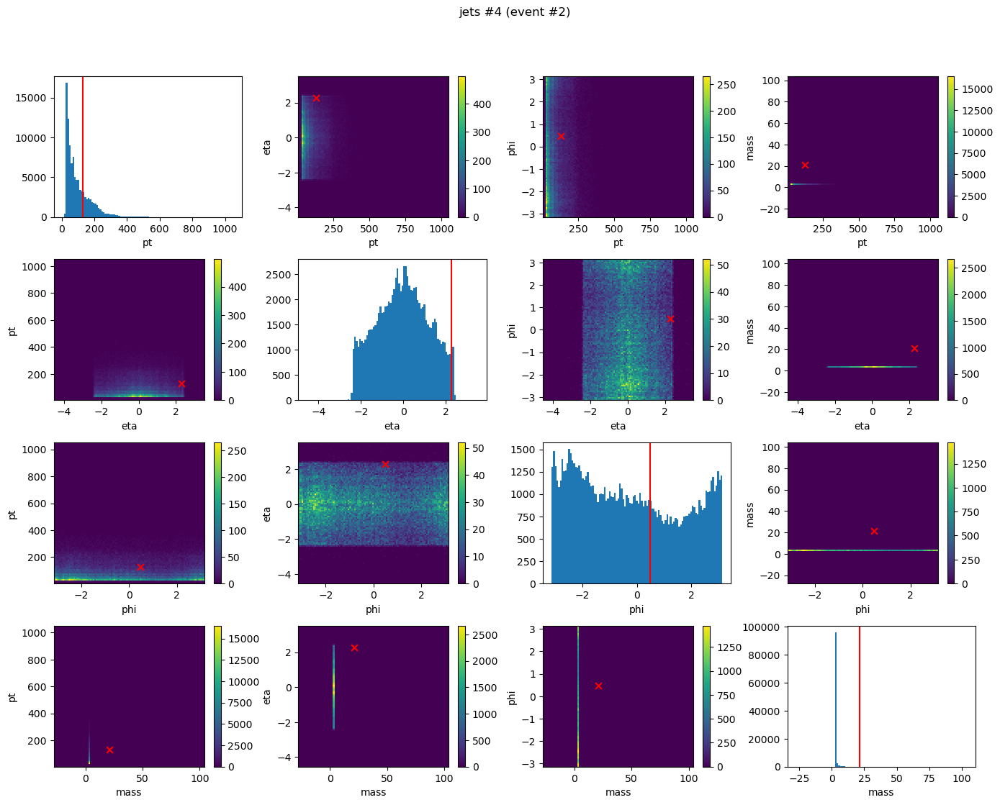

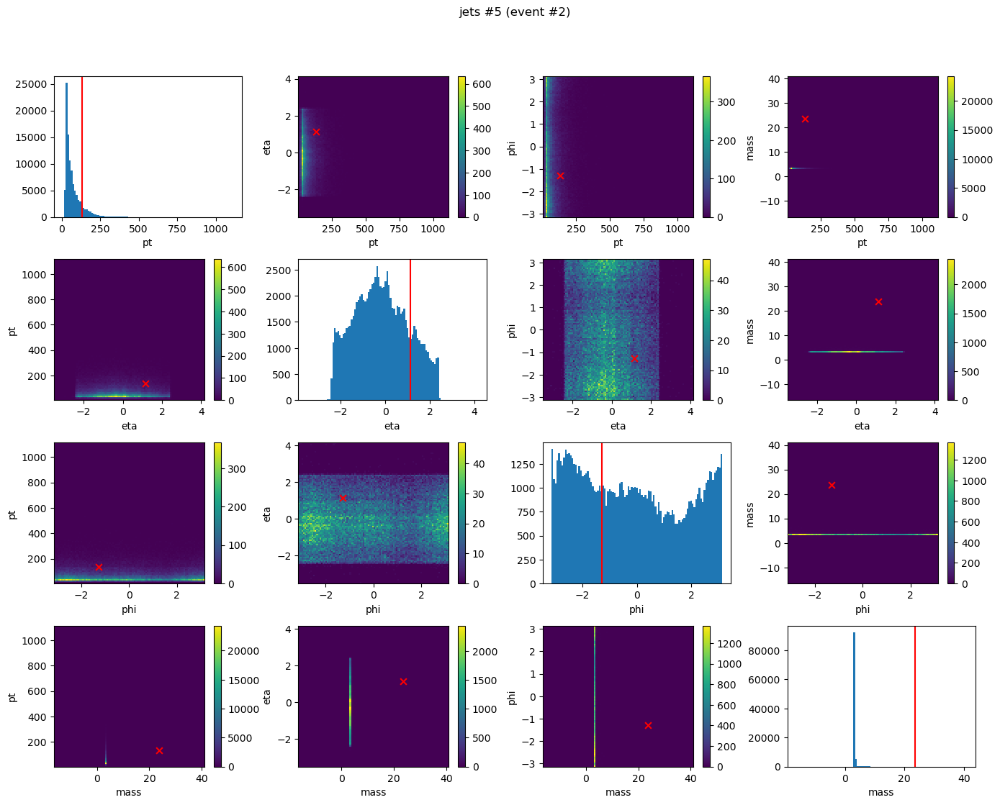

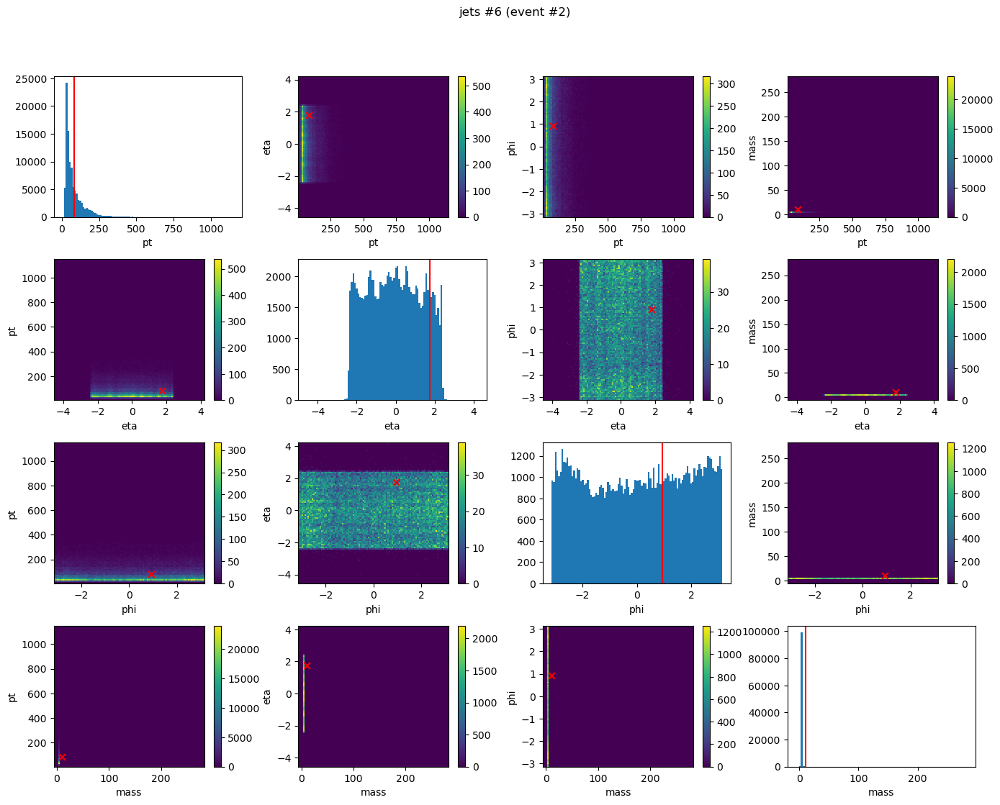

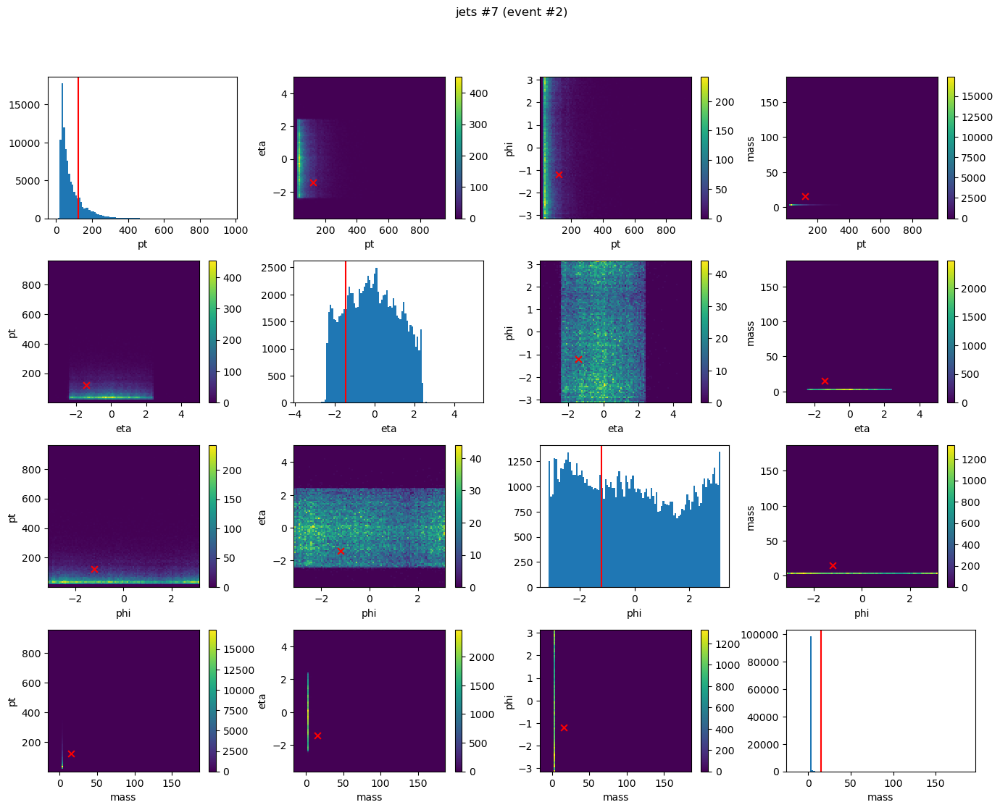

{'event_0_obj_electrons_0': <Figure size 1600x1200 with 28 Axes>,
 'event_0_obj_electrons_1': <Figure size 1600x1200 with 28 Axes>,
 'event_0_obj_met_0': <Figure size 800x600 with 6 Axes>,
 'event_0_obj_jets_0': <Figure size 1600x1200 with 28 Axes>,
 'event_0_obj_jets_1': <Figure size 1600x1200 with 28 Axes>,
 'event_0_obj_jets_2': <Figure size 1600x1200 with 28 Axes>,
 'event_0_obj_jets_3': <Figure size 1600x1200 with 28 Axes>,
 'event_0_obj_jets_4': <Figure size 1600x1200 with 28 Axes>,
 'event_0_obj_jets_5': <Figure size 1600x1200 with 28 Axes>,
 'event_0_obj_jets_6': <Figure size 1600x1200 with 28 Axes>,
 'event_0_obj_jets_7': <Figure size 1600x1200 with 28 Axes>,
 'event_1_obj_muons_0': <Figure size 1600x1200 with 28 Axes>,
 'event_1_obj_muons_1': <Figure size 1600x1200 with 28 Axes>,
 'event_1_obj_met_0': <Figure size 800x600 with 6 Axes>,
 'event_1_obj_jets_0': <Figure size 1600x1200 with 28 Axes>,
 'event_1_obj_jets_1': <Figure size 1600x1200 with 28 Axes>,
 'event_1_obj_jets_2

In [25]:
sampling = SamplingCallback(
    dataset = comb_dataset,
    idx_to_monitor = idx_to_monitor,
    N_sample = 100000, 
    frequency = 1,
    raw = True,
    bins = 101,
    log_scale = False,
)
sampling.make_sampling_plots(model,show=True)

# sampling = SamplingCallback(
#     comb_dataset = comb_dataset,
#     idx_to_monitor = idx_to_monitor,
#     N_sample = 100000, 
#     frequency = 1,
#     raw = False,
#     bins = 25,
#     log_scale = False,
# )
# sampling.make_sampling_plots(model,show=True)

Predict:  43%|███████████████                    | 9/21 [00:16<00:21,  1.80s/it]


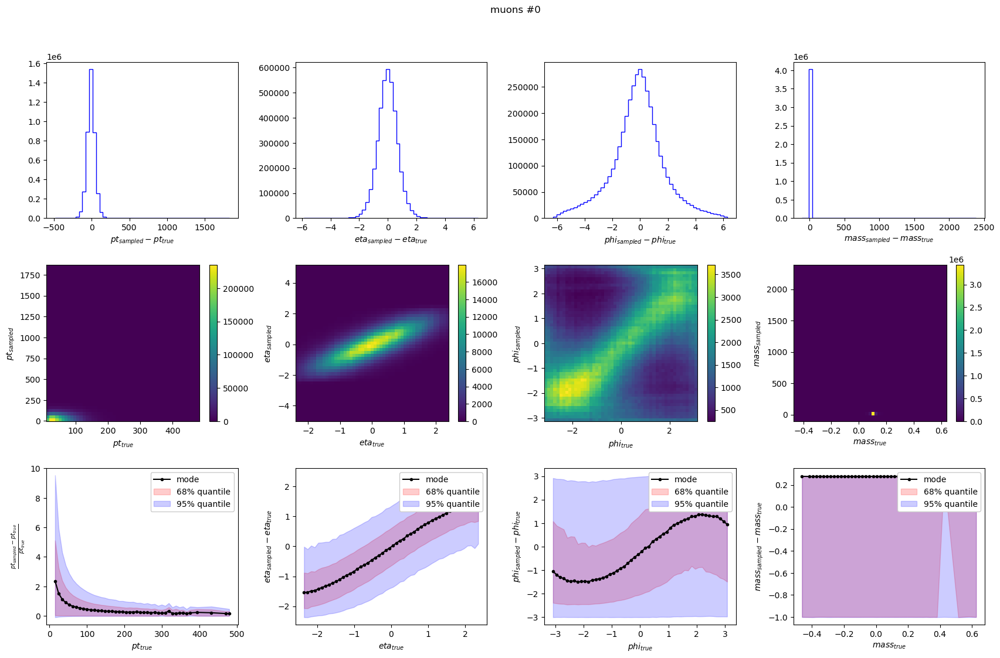

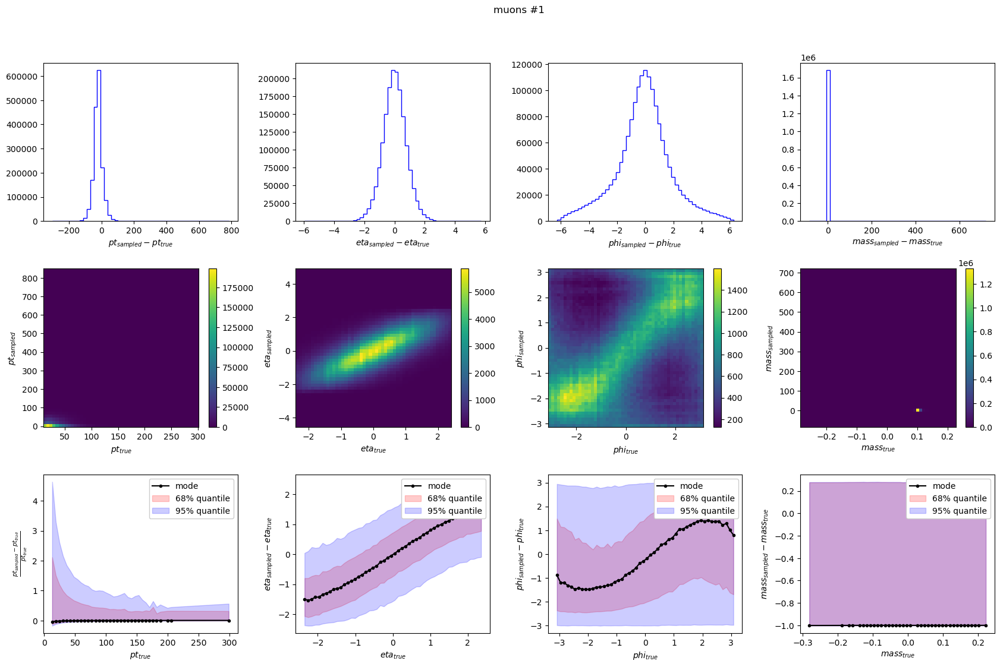

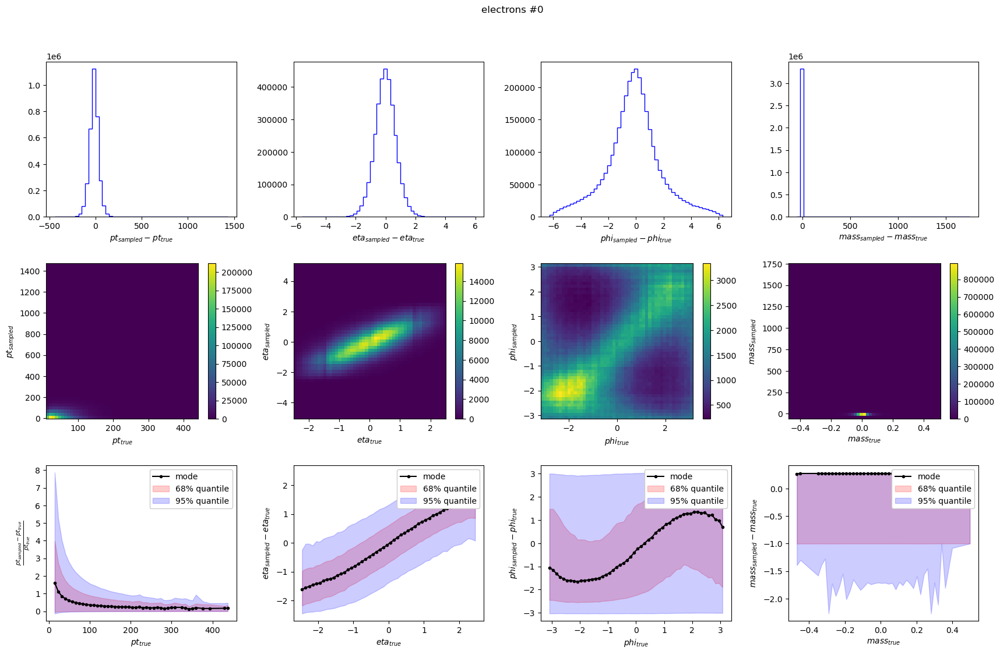

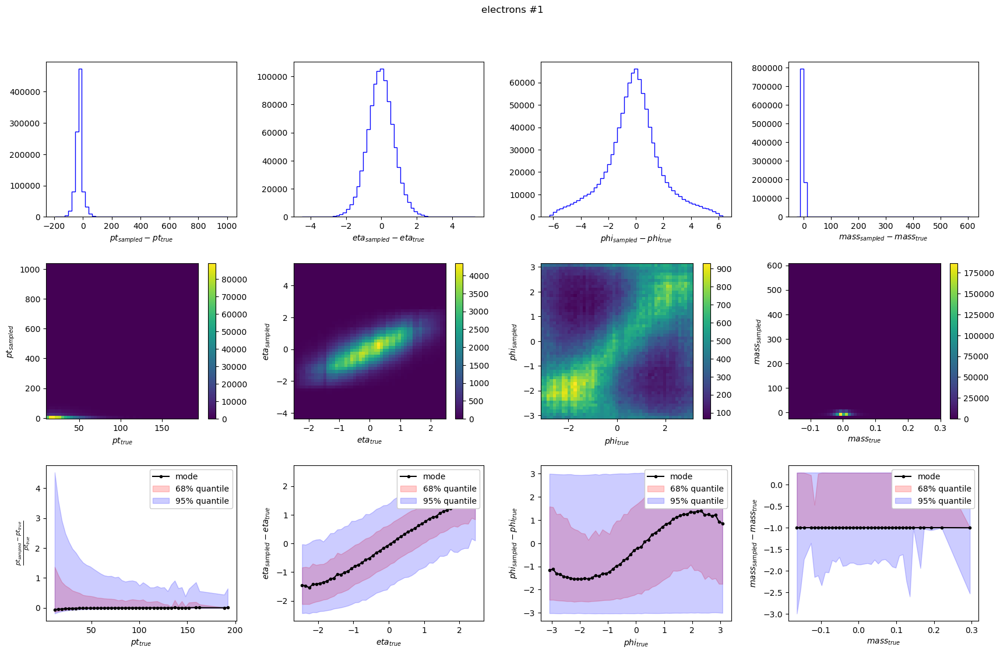

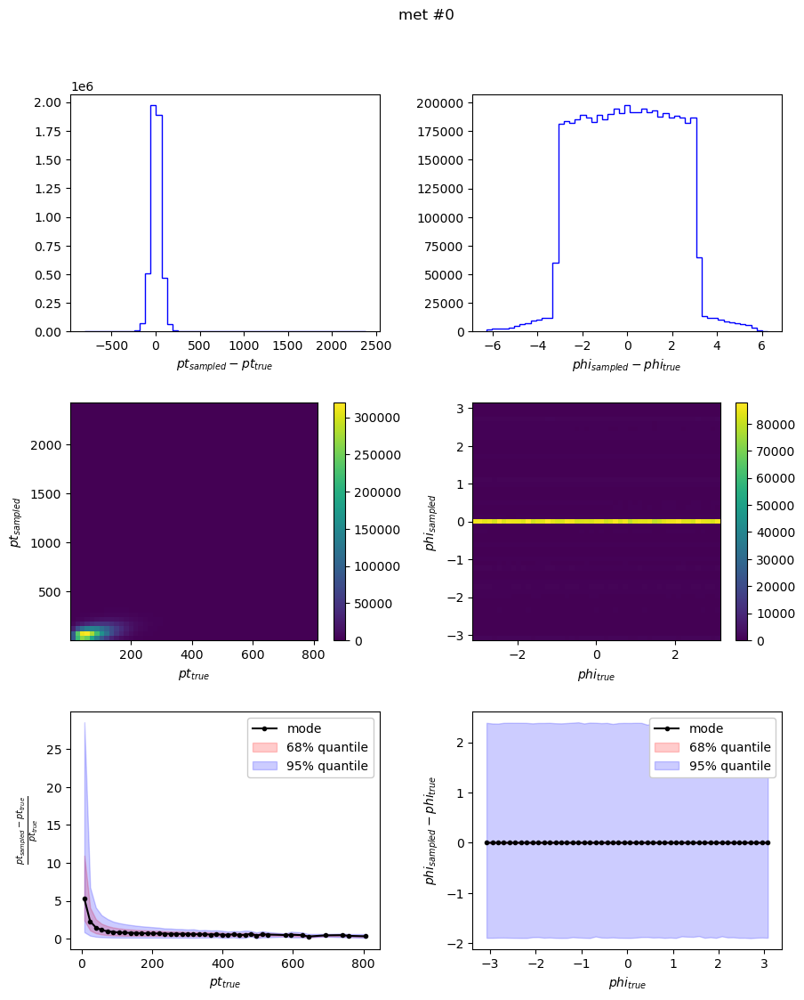

...

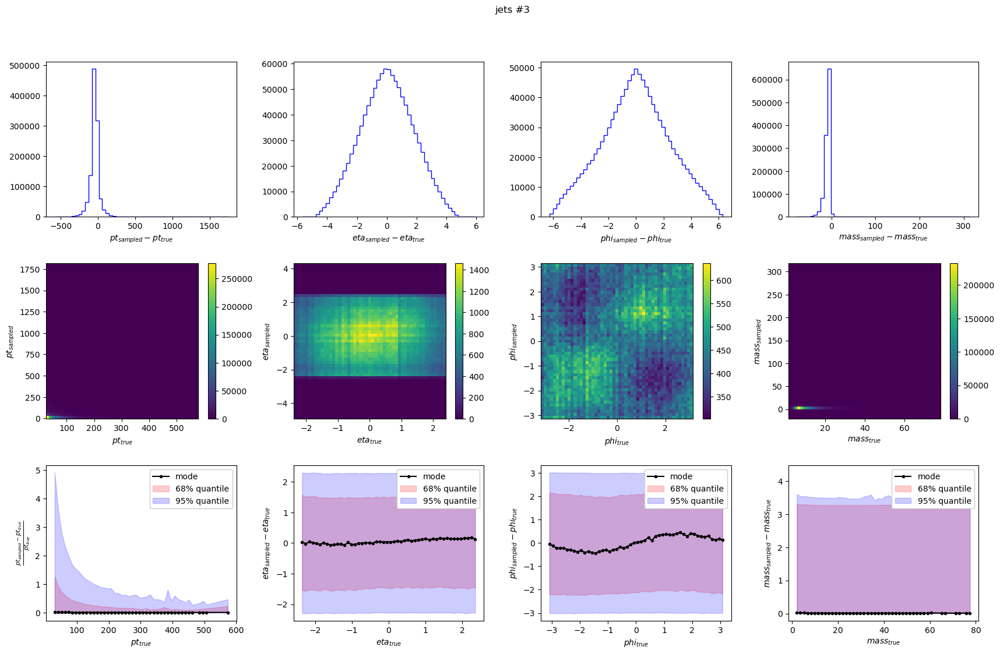

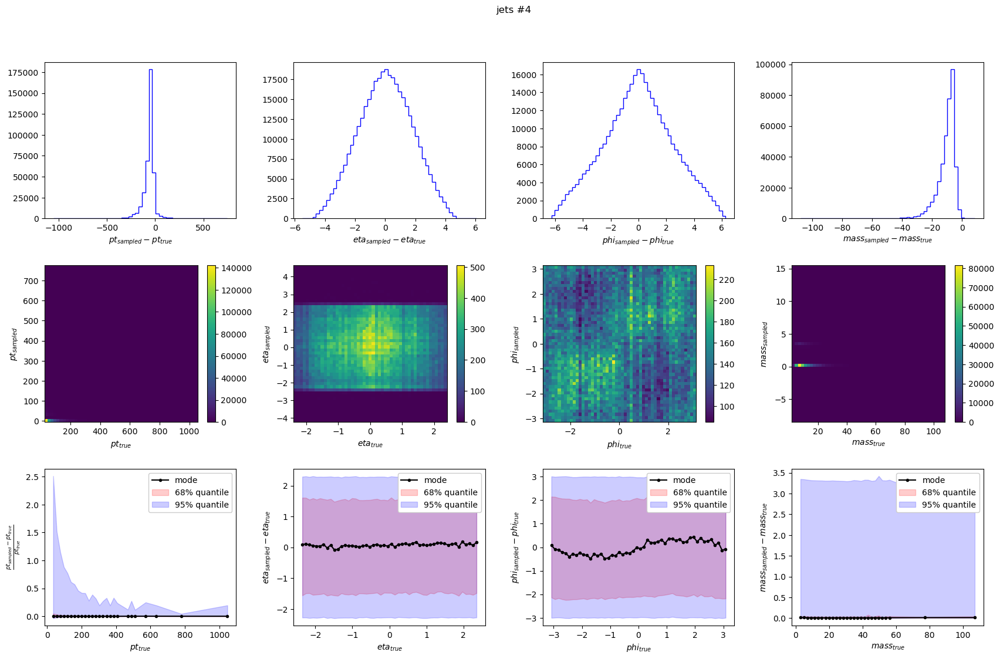

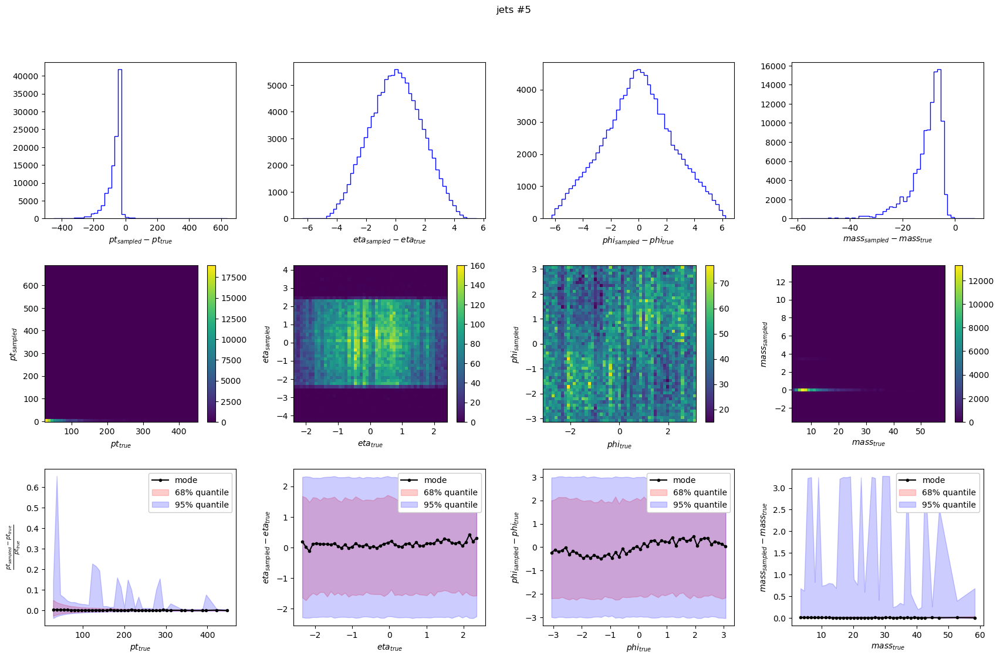

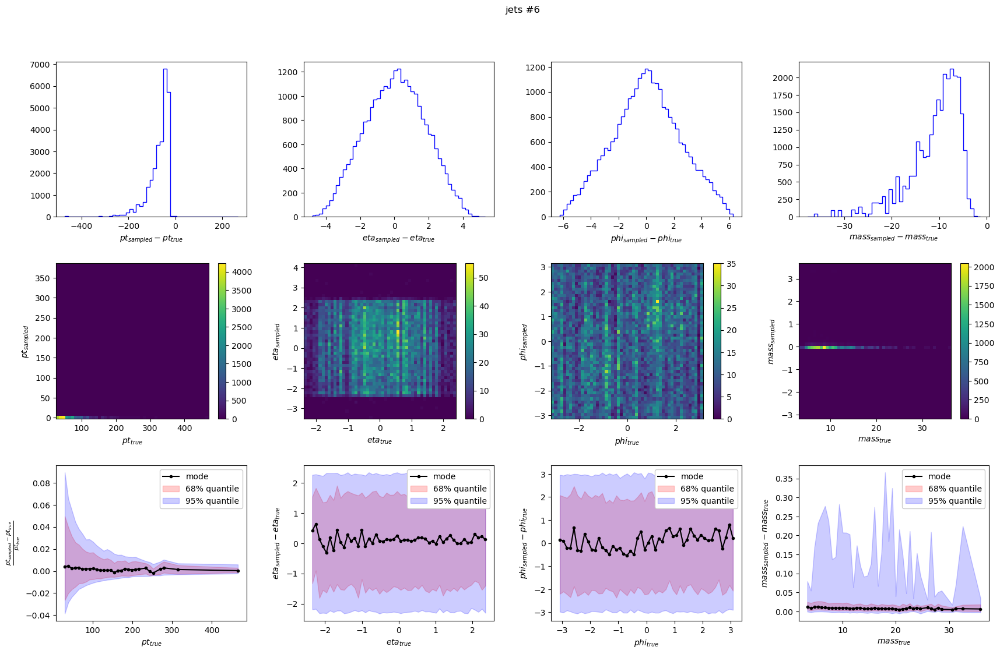

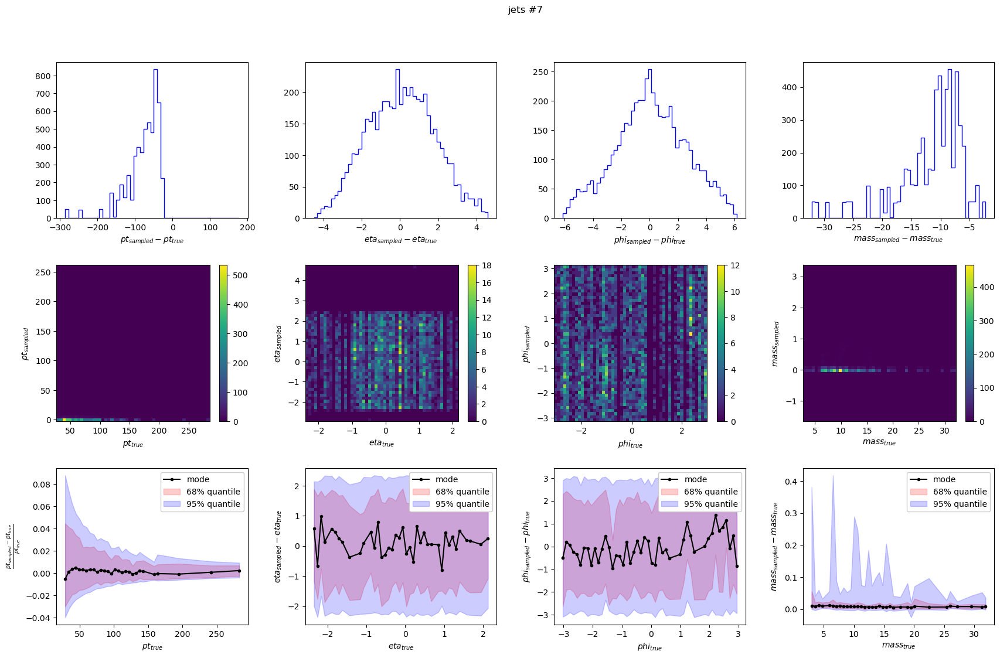

In [23]:
bias = BiasCallback(
    dataset = comb_dataset,
    N_sample = 50,
    frequency = 1,
    raw = True,
    bins = 51,
    log_scale = False,
    batch_size = 10000,
    N_batch = 10,
)
figs = bias.make_bias_plots(model,show=True)